## Preparation

Bring in libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from matplotlib.collections import PatchCollection
# import os
# import time
from tqdm import tqdm_notebook
from scipy.spatial.distance import cdist
import imageio
import geopandas as gpd
import folium
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm_notebook
import imageio
from scipy.spatial.distance import cdist
import numpy as np
import matplotlib.pyplot as plt
import random
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

Data

In [2]:
capital_cities = pd.read_csv('../../Data/capital_cities_and_airports.csv')

display(capital_cities.shape)
display(capital_cities.head())

(42, 8)

,country,capital_city,capital_latitude,capital_longitude,airport_iata,airport_name,airport_latitude,airport_longitude
0,Armenia,Yerevan,40.1812,44.5136,EVN,Zvartnots International Airport,40.147301,44.395901
1,Azerbaijan,Baku,40.3953,49.8622,GYD,Heydar Aliyev International Airport,40.467499,50.046700
2,Bahrain,Manama,26.2361,50.5831,BAH,Bahrain International Airport,26.270800,50.633598
3,Bangladesh,Dhaka,23.7231,90.4086,DAC,Hazrat Shahjalal International Airport,23.843347,90.397783
4,Brunei,Bandar Seri Begawan,4.8833,114.9333,BWN,Brunei International Airport,4.944200,114.928001


In [3]:
best_flights_data = pd.read_csv('../../Data/best_flights_data.csv')

display(best_flights_data.shape)
display(best_flights_data.head())

(1722, 14)

,id,price_amount,marketing_carrier_name,origin_place_name,origin_place_iata,destination_place_name,destination_place_iata,departure_datetime,arrival_datetime,departure_query,arrival_query,segment_count,total_flight_duration,flight_score
0,9445-2305221250--32348-1-9561-2305230325,368.17,Emirates > Emirates,Amman Queen Alia > Dubai,AMM > DXB,Dubai > Ashgabat,DXB > ASB,2023-05-22 12:50:00,2023-05-23 03:25:00,AMM,ASB,2,330,578.17
1,9445-2305220835--32761-0-9618-2305221240,82.34,Wizz Air Abu Dhabi,Amman Queen Alia,AMM,Abu Dhabi International,AUH,2023-05-22 08:35:00,2023-05-22 12:40:00,AMM,AUH,1,185,194.01
2,"9445-2305221730--30759,-31669-1-9715-2305230640",207.99,Air Arabia Abu Dhabi > Wizz Air,Amman Queen Alia > Abu Dhabi International,AMM > AUH,Abu Dhabi International > Bahrain,AUH > BAH,2023-05-22 17:30:00,2023-05-23 06:40:00,AMM,BAH,2,250,391.32
3,9445-2305221000--32062-0-9834-2305221100,188.90,MEA,Amman Queen Alia,AMM,Beirut,BEY,2023-05-22 10:00:00,2023-05-22 11:00:00,AMM,BEY,1,60,258.90
4,9445-2305220515--31923-0-9882-2305220700,214.90,Royal Jordanian,Amman Queen Alia,AMM,Baghdad International,BGW,2023-05-22 05:15:00,2023-05-22 07:00:00,AMM,BGW,1,105,299.90


In [4]:
# Asia shapefile
world_map = gpd.read_file(
    '../../Data/WorldAdministrativeBoundaries/world-administrative-boundaries.shp')

## EDA

In [5]:
# create geodataframe
gdf_airports = gpd.GeoDataFrame(capital_cities,
                                geometry=gpd.points_from_xy(capital_cities.airport_longitude,
                                                            capital_cities.airport_latitude))
# filter map to include only asia
asia_map = world_map.query("continent == 'Asia'")

# init folium map
m = folium.Map(location=[asia_map.bounds.mean()[1], asia_map.bounds.mean()[0]],
               zoom_start=3,
               # Esri.NatGeoWorldMap tile
               tiles='https://server.arcgisonline.com/ArcGIS/rest/services/NatGeo_World_Map/MapServer/tile/{z}/{y}/{x}',
               attr='Tiles &copy; Esri &mdash; National Geographic, Esri, DeLorme, NAVTEQ, UNEP-WCMC, USGS, NASA, ESA, METI, NRCAN, GEBCO, NOAA, iPC',
               )

# add asia shapefile
folium.GeoJson(asia_map).add_to(m)

# add markers
for lat, lon, city, country, airport in zip(gdf_airports.geometry.y, gdf_airports.geometry.x, gdf_airports.capital_city, gdf_airports.country, gdf_airports.airport_name):
    folium.Marker(location=[lat, lon],
                  tooltip=f'{airport}<br>{city}, {country}').add_to(m)

# show
m

Figure: `Folium` world map with overlay over Asia showing the capital cities of interest, with a tile by @national_geographic_esrinatgeoworldmap_2023 and administrative boundaries from @opendatasoft_world_2022.

In [6]:


# Create a pivot table to form an adjacency matrix
adjacency_matrix = best_flights_data.pivot_table(
    index='departure_query',
    columns='arrival_query',
    values='price_amount'
)

# Fill the NaN values with 0
adjacency_matrix = adjacency_matrix.fillna(0)



In [7]:
import geopandas as gpd
import folium
from folium.plugins import MarkerCluster
from folium import PolyLine
from folium.features import GeoJsonTooltip
from shapely.geometry import LineString

# create geodataframe
gdf_airports = gpd.GeoDataFrame(capital_cities,
                                geometry=gpd.points_from_xy(capital_cities.airport_longitude,
                                                            capital_cities.airport_latitude))
# filter map to include only asia
asia_map = world_map.query("continent == 'Asia'")

# init folium map
m = folium.Map(location=[asia_map.bounds.mean()[1], asia_map.bounds.mean()[0]],
               zoom_start=3,
               # Esri.NatGeoWorldMap tile
               tiles='https://server.arcgisonline.com/ArcGIS/rest/services/NatGeo_World_Map/MapServer/tile/{z}/{y}/{x}',
               attr='Tiles &copy; Esri &mdash; National Geographic, Esri, DeLorme, NAVTEQ, UNEP-WCMC, USGS, NASA, ESA, METI, NRCAN, GEBCO, NOAA, iPC',
               )

# add asia shapefile
folium.GeoJson(asia_map).add_to(m)

# add markers
for lat, lon, city, country, airport in zip(gdf_airports.geometry.y, gdf_airports.geometry.x, gdf_airports.capital_city, gdf_airports.country, gdf_airports.airport_name):
    folium.Marker(location=[lat, lon],
                  tooltip=f'{airport}<br>{city}, {country}').add_to(m)


# Function to determine the color of the line based on the price
def get_color(price):
    if price <= 300:
        return 'green'
    elif price <= 700:
        return 'blue'
    elif price <= 1000:
        return 'orange'
    else:
        return 'red'


def create_offset_line(coords1, coords2, offset_value):
    line = LineString([coords1, coords2])
    offset_line = line.parallel_offset(offset_value, 'left')
    return [(x, y) for x, y in offset_line.coords]


# Iterate through the best_flights_data DataFrame and draw lines between the airports
for _, row in best_flights_data.iterrows():
    departure_airport = row['departure_query']
    arrival_airport = row['arrival_query']
    price = row['price_amount']
    segment_count = row['segment_count']
    total_flight_duration = row['total_flight_duration']

    # Get the departure and arrival airport coordinates and capital cities
    departure_data = capital_cities.loc[capital_cities['airport_iata']
                                        == departure_airport]
    departure_coords = departure_data[[
        'airport_latitude', 'airport_longitude']].values[0]
    departure_city = departure_data['capital_city'].values[0]

    arrival_data = capital_cities.loc[capital_cities['airport_iata']
                                      == arrival_airport]
    arrival_coords = arrival_data[[
        'airport_latitude', 'airport_longitude']].values[0]
    arrival_city = arrival_data['capital_city'].values[0]

    # Create an offset line with a small distance (e.g., 0.1 degrees)
    offset_coords = create_offset_line(
        (departure_coords[1], departure_coords[0]), (arrival_coords[1], arrival_coords[0]), 0.1)

    # Create a GeoJson object with a feature and properties
    line_data = {
        "type": "Feature",
        "geometry": {
            "type": "LineString",
            "coordinates": offset_coords
        },
        "properties": {
            "color": get_color(price),
            "from_to": f"{departure_city} - {arrival_city}",
            "price": price,
            "segment_count": segment_count,
            "total_flight_duration": total_flight_duration
        }
    }

    # Add a GeoJsonTooltip with the desired properties
    tooltip = GeoJsonTooltip(fields=["from_to", "price", "segment_count", "total_flight_duration"],
                             aliases=["Route", "Price", "Segment Count",
                                      "Total Flight Duration"],
                             localize=True)

    # Add the GeoJson object with the tooltip to the map
    folium.GeoJson(line_data,
                   style_function=lambda x: {
                       'color': x['properties']['color']},
                   tooltip=tooltip).add_to(m)

# Show the map
m

## Experiments

In [8]:
def create_transition_matrix_numpy(best_flights_data, capital_cities):
    n = len(capital_cities)
    city_to_index = {city: idx for idx, city in enumerate(capital_cities)}

    transition_matrix = np.zeros((n, n))

    for idx, row in best_flights_data.iterrows():
        departure = row["departure_query"]
        arrival = row["arrival_query"]
        price = row["flight_score"]

        i = city_to_index[departure]
        j = city_to_index[arrival]

        transition_matrix[i, j] = price

    np.fill_diagonal(transition_matrix, 0)
    return transition_matrix


airport_list = best_flights_data["departure_query"].unique().tolist()
transition_matrix = create_transition_matrix_numpy(
    best_flights_data, airport_list)
transition_matrix

array([[   0.  ,  578.17,  194.01, ...,  882.05, 1054.27,  857.99],
       [ 845.67,    0.  ,  770.67, ..., 1352.2 , 1311.32, 1301.57],
       [ 185.28,  571.99,    0.  , ...,  662.4 ,  874.66,  589.32],
       ...,
       [1616.72, 1111.93,  741.83, ...,    0.  ,  770.37,  670.09],
       [1170.53, 1321.99,  997.67, ...,  645.93,    0.  ,  685.1 ],
       [1027.99, 1129.9 ,  661.66, ...,  480.85,  873.74,    0.  ]])

Q Agent (based on  source)

In [10]:
class TravelQAgent(object):
    def __init__(self, states_size, actions_size, epsilon=1.0, epsilon_min=0.01, epsilon_decay=0.999, gamma=0.95, lr=0.8):
        self.states_size = states_size
        self.actions_size = actions_size
        self.epsilon = epsilon
        self.epsilon_min = epsilon_min
        self.epsilon_decay = epsilon_decay
        self.gamma = gamma
        self.lr = lr
        self.Q = self.build_model(states_size, actions_size)
        self.reset_memory()

    def build_model(self, states_size, actions_size):
        Q = np.zeros([states_size, actions_size])
        return Q

    def train(self, s, a, r, s_next):
        self.Q[s, a] = self.Q[s, a] + self.lr * \
            (r + self.gamma*np.max(self.Q[s_next, a]) - self.Q[s, a])

        if self.epsilon > self.epsilon_min:
            self.epsilon *= self.epsilon_decay

    def act(self, s):
        q = np.copy(self.Q[s, :])
        q[self.states_memory] = -np.inf

        if np.random.rand() > self.epsilon:
            a = np.argmax(q)
        else:
            a = np.random.choice(
                [x for x in range(self.actions_size) if x not in self.states_memory])

        return a

    def remember_state(self, s):
        self.states_memory.append(s)

    def reset_memory(self):
        self.states_memory = []


Environment

In [11]:

class FlightTravelEnvironment(object):
    def __init__(self, capital_cities, airport_list, transition_matrix, best_flights_data, **kwargs):
        print(
            f"Initialized Delivery Environment with {len(airport_list)} airports")

        # Initialization
        self.capital_cities = capital_cities
        self.airport_data = airport_list
        self.transition_matrix = transition_matrix
        self.best_flights_data = best_flights_data

        self.n_stops = len(airport_list)
        self.action_space = self.n_stops
        self.observation_space = self.n_stops
        self.stops = []
        
        #store
        self.total_price_amount = 0
        self.total_flight_duration = 0
        self.total_segment_count = 0

        # Generate stops
        self._generate_q_values()
        self.render()

        # Initialize first point
        self.reset()

    def _generate_q_values(self):
        # Generate actual Q Values corresponding to price between two airports
        self.q_stops = self.transition_matrix

    def render(self, return_img=False):

        self.x = self.capital_cities["airport_longitude"].to_numpy()
        self.y = self.capital_cities["airport_latitude"].to_numpy()

        fig = plt.figure(figsize=(7, 7))
        ax = fig.add_subplot(111)
        ax.set_title("Delivery Stops")

        # Show stops
        ax.scatter(self.x, self.y, c="red", s=50)

        # Show START
        if len(self.stops) > 0:
            xy = self._get_xy(initial=True)
            xytext = xy[0]+0.1, xy[1]-0.05
            ax.annotate("START", xy=xy, xytext=xytext, weight="bold")

        # Show itinerary
        if len(self.stops) > 1:
            ax.plot(self.x[self.stops], self.y[self.stops],
                    c="blue", linewidth=1, linestyle="--")

            # Annotate END
            xy = self._get_xy(initial=False)
            xytext = xy[0]+0.1, xy[1]-0.05
            ax.annotate("END", xy=xy, xytext=xytext, weight="bold")

        if hasattr(self, "box"):
            left, bottom = self.box[0], self.box[2]
            width = self.box[1] - self.box[0]
            height = self.box[3] - self.box[2]
            rect = Rectangle((left, bottom), width, height)
            collection = PatchCollection([rect], facecolor="red", alpha=0.2)
            ax.add_collection(collection)

        plt.xticks([])
        plt.yticks([])

        if return_img:
            # From https://ndres.me/post/matplotlib-animated-gifs-easily/
            fig.canvas.draw_idle()
            image = np.frombuffer(fig.canvas.tostring_rgb(), dtype='uint8')
            image = image.reshape(fig.canvas.get_width_height()[::-1] + (3,))
            plt.close()
            return image
        else:
            plt.show()

    def reset_accumulated_values(self):
        self.total_price_amount = 0
        self.total_flight_duration = 0
        self.total_segment_count = 0
    
    def reset(self):
        
        self.reset_accumulated_values()

        # Stops placeholder
        self.stops = []

        # Random first stop
        first_stop = np.random.randint(self.n_stops)
        self.stops.append(first_stop)

        return first_stop

    def step(self, destination):

        # Get current state
        state = self._get_state()
        new_state = destination
        
        # get codes for storing the price etc
        state_code = self.airport_data[state]
        new_state_code = self.airport_data[new_state]

        # Get reward for such a move
        reward = self._get_reward(state, new_state)

        # Append new_state to stops
        self.stops.append(destination)
        done = len(self.stops) == self.n_stops

        # Update the accumulated values
        row = self.best_flights_data.loc[(self.best_flights_data['departure_query'] == state_code) & (self.best_flights_data['arrival_query'] == new_state_code)].iloc[0]
        self.total_price_amount += row["price_amount"]
        self.total_flight_duration += row["total_flight_duration"]
        self.total_segment_count += row["segment_count"]

        return new_state, reward, done

    def _get_state(self):
        return self.stops[-1]

    def _get_xy(self, initial=False):
        state = self.stops[0] if initial else self._get_state()
        x = self.x[state]
        y = self.y[state]
        return x, y

    def _get_reward(self, state, new_state):
        base_reward = self.q_stops[state, new_state]

        return base_reward


    @staticmethod
    def _calculate_point(x1, x2, y1, y2, x=None, y=None):

        if y1 == y2:
            return y1
        elif x1 == x2:
            return x1
        else:
            a = (y2-y1)/(x2-x1)
            b = y2 - a * x2

            if x is None:
                x = (y-b)/a
                return x
            elif y is None:
                y = a*x+b
                return y
            else:
                raise Exception("Provide x or y")



In [ ]:
def run_episode(env, agent, verbose=1):

    s = env.reset()
    agent.reset_memory()

    max_step = env.n_stops

    episode_reward = 0

    i = 0
    while i < max_step:

        # Remember the states
        agent.remember_state(s)

        # Choose an action
        a = agent.act(s)

        # Take the action, and get the reward from environment
        s_next, r, done = env.step(a)

        # Tweak the reward
        r = -1 * r

        if verbose:
            print(s_next, r, done)

        # Update our knowledge in the Q-table
        agent.train(s, a, r, s_next)

        # Update the caches
        episode_reward += r
        s = s_next

        # If the episode is terminated
        i += 1
        if done:
            break

    return env, agent, episode_reward, env.total_price_amount, env.total_flight_duration, env.total_segment_count


In [ ]:
def run_n_episodes(env, agent, name="training.gif", n_episodes=100, render_each=10, fps=10):

    # Store the rewards
    rewards = []
    imgs = []
    price_amounts = []
    flight_durations = []
    segment_counts = []

    # Experience replay
    for i in tqdm_notebook(range(n_episodes)):

        # Run the episode
        env, agent, episode_reward, total_price_amount, total_flight_duration, total_segment_count = run_episode(env, agent, verbose=0)
        
        rewards.append(episode_reward)

        price_amounts.append(total_price_amount)
        flight_durations.append(total_flight_duration)
        segment_counts.append(total_segment_count)

        if i % render_each == 0:
            img = env.render(return_img=True)
            imgs.append(img)

    # Show rewards
    plt.figure(figsize=(10, 6))
    plt.title("Flight Score During Taining")
    plt.plot(rewards)
    plt.show()
    
    plt.figure(figsize=(10, 6))
    plt.title("Accumulated Price Amount per Episode")
    plt.plot(price_amounts)
    plt.show()

    plt.figure(figsize=(10, 6))
    plt.title("Accumulated Flight Duration per Episode")
    plt.plot(flight_durations)
    plt.show()

    plt.figure(figsize=(10, 6))
    plt.title("Accumulated Segment Count per Episode")
    plt.plot(segment_counts)
    plt.show()

    # Save imgs as gif
    imageio.mimsave(name, imgs, fps=fps)

    return env, agent

Initialized Delivery Environment with 42 airports


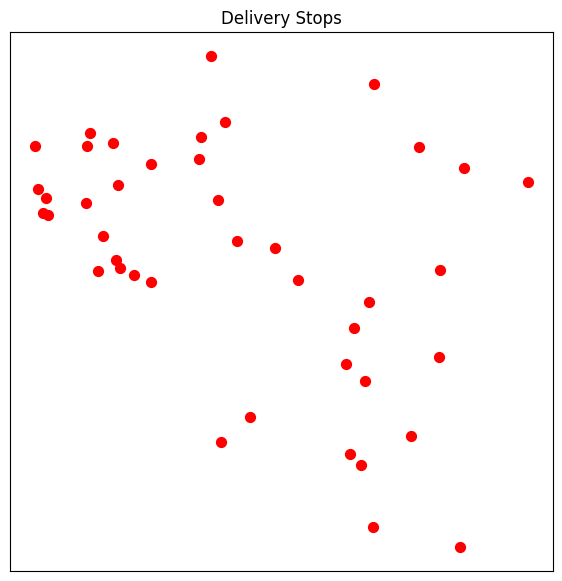

  0%|          | 0/200 [00:00<?, ?it/s]

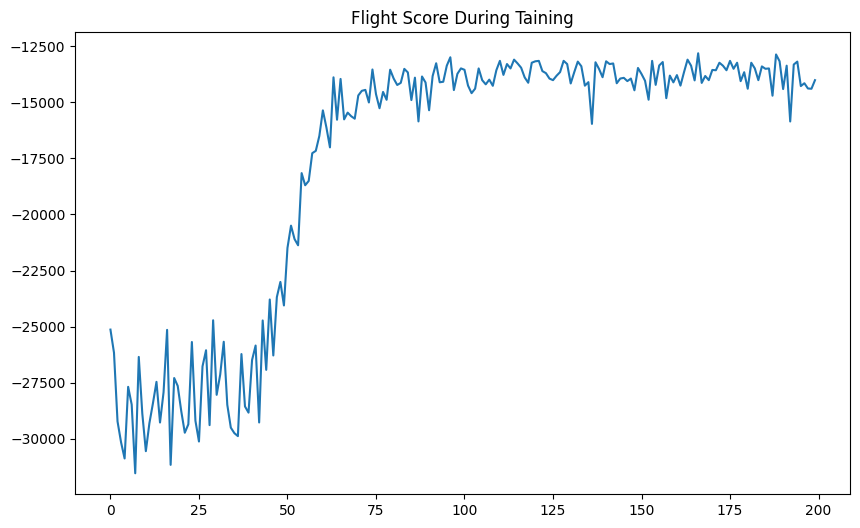

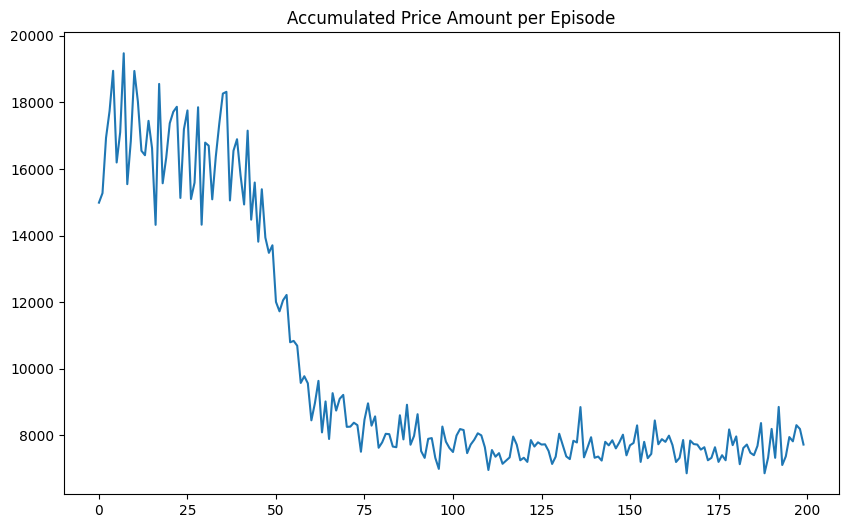

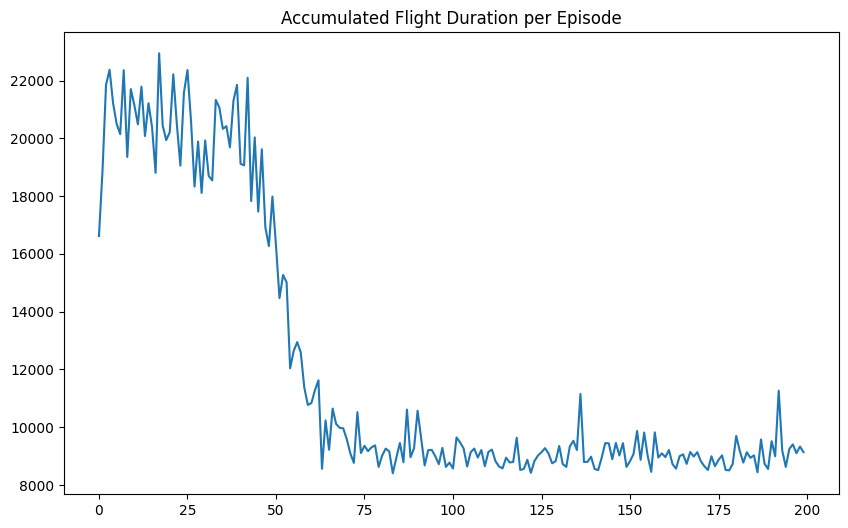

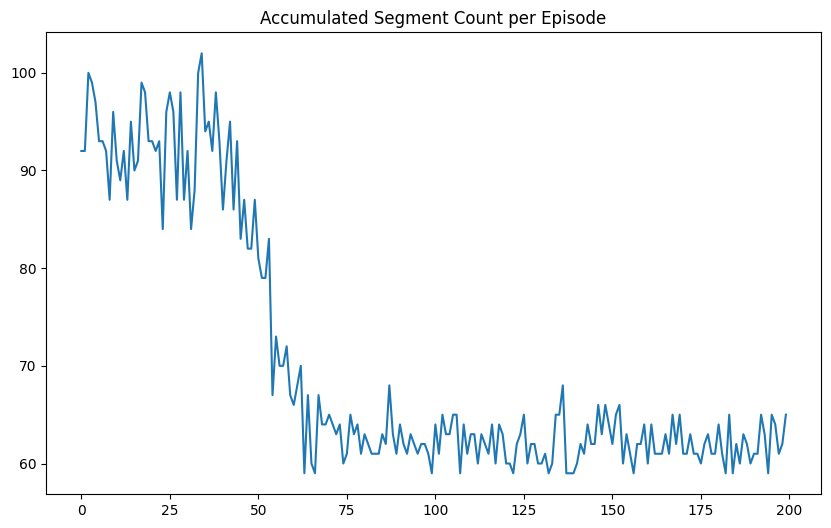

(<__main__.FlightTravelEnvironment at 0x17fca74c0>,
 <__main__.TravelQAgent at 0x17fcd6aa0>)

In [18]:
env = FlightTravelEnvironment(capital_cities, airport_list, transition_matrix, best_flights_data)
agent = TravelQAgent(env.observation_space, env.action_space)
run_n_episodes(env, agent, "stops.gif", n_episodes=200)

In [38]:
def render(stops, map_title):
    gdf_airports = gpd.GeoDataFrame(capital_cities,
                                    geometry=gpd.points_from_xy(capital_cities.airport_longitude,
                                                                capital_cities.airport_latitude))
    asia_map = world_map.query("continent == 'Asia'")

    m = folium.Map(location=[asia_map.bounds.mean()[1], asia_map.bounds.mean()[0]],
                   zoom_start=3,
                   tiles='https://server.arcgisonline.com/ArcGIS/rest/services/NatGeo_World_Map/MapServer/tile/{z}/{y}/{x}',
                   attr='Tiles &copy; Esri &mdash; National Geographic, Esri, DeLorme, NAVTEQ, UNEP-WCMC, USGS, NASA, ESA, METI, NRCAN, GEBCO, NOAA, iPC',
                   )

    folium.GeoJson(asia_map).add_to(m)

    for lat, lon, city, country, airport in zip(gdf_airports.geometry.y, gdf_airports.geometry.x, gdf_airports.capital_city, gdf_airports.country, gdf_airports.airport_name):
        folium.Marker(location=[lat, lon],
                      tooltip=f'{airport}<br>{city}, {country}').add_to(m)

    if len(stops) > 1:
        for i in range(len(stops) - 1):
            x = capital_cities["airport_longitude"].to_numpy()[stops[i:i+2]]
            y = capital_cities["airport_latitude"].to_numpy()[stops[i:i+2]]
            locations = list(zip(y, x))
            from_city = capital_cities.loc[stops[i], "capital_city"]
            from_country = capital_cities.loc[stops[i], "country"]
            to_city = capital_cities.loc[stops[i+1], "capital_city"]
            to_country = capital_cities.loc[stops[i+1], "country"]
            polyline = folium.PolyLine(locations, color="blue", weight=2.5, opacity=1)
            polyline.add_child(folium.Tooltip(f'From: {from_city}, {from_country}<br>To: {to_city}, {to_country}'))
            polyline.add_to(m)

    return m


In [30]:
# Access the first and last episode stops
first_episode_stops = agent.episode_stops[0]
last_episode_stops = agent.episode_stops[-1]

In [39]:
render(first_episode_stops, "First Episode")
#first_episode_map = render(first_episode_stops, "First Episode")


In [40]:
render(last_episode_stops, "Last Episode")


In [15]:
def run_episode(env, agent, verbose=1):

    s = env.reset()
    agent.reset_memory()

    max_step = env.n_stops

    episode_reward = 0

    i = 0
    while i < max_step:

        # Remember the states
        agent.remember_state(s)

        # Choose an action
        a = agent.act(s)

        # Take the action, and get the reward from environment
        s_next, r, done = env.step(a)

        # Tweak the reward
        r = -1 * r

        if verbose:
            print(s_next, r, done)

        # Update our knowledge in the Q-table
        agent.train(s, a, r, s_next, done)  # Add the 'done' parameter here

        # Update the caches
        episode_reward += r
        s = s_next

        # If the episode is terminated
        i += 1
        if done:
            break

    return env, agent, episode_reward, env.total_price_amount, env.total_flight_duration, env.total_segment_count


In [14]:
class TravelQAgent(object):
    def __init__(self, states_size, actions_size, epsilon=1.0, epsilon_min=0.01, epsilon_decay=0.999, gamma=0.95, lr=0.8):
        self.states_size = states_size
        self.actions_size = actions_size
        self.epsilon = epsilon
        self.epsilon_min = epsilon_min
        self.epsilon_decay = epsilon_decay
        self.gamma = gamma
        self.lr = lr
        self.Q = self.build_model(states_size, actions_size)
        self.reset_memory()
        self.episode_stops = [] 

    def build_model(self, states_size, actions_size):
        Q = np.zeros([states_size, actions_size])
        return Q

    def train(self, s, a, r, s_next, done):  # Add the 'done' parameter
        self.Q[s, a] = self.Q[s, a] + self.lr * \
            (r + self.gamma*np.max(self.Q[s_next, a]) - self.Q[s, a])

        if self.epsilon > self.epsilon_min:
            self.epsilon *= self.epsilon_decay

        self.remember_state(s)

        if done:  # Check if the episode is complete
            self.episode_stops.append(self.states_memory)
            self.reset_memory()

    def act(self, s):
        q = np.copy(self.Q[s, :])
        q[self.states_memory] = -np.inf

        if np.random.rand() > self.epsilon:
            a = np.argmax(q)
        else:
            a = np.random.choice(
                [x for x in range(self.actions_size) if x not in self.states_memory])

        return a

    def remember_state(self, s):
        self.states_memory.append(s)

    def reset_memory(self):
        self.states_memory = []


In [17]:

class FlightTravelEnvironment(object):
    def __init__(self, capital_cities, airport_list, transition_matrix, best_flights_data, **kwargs):
        print(
            f"Initialized Delivery Environment with {len(airport_list)} airports")

        # Initialization
        self.capital_cities = capital_cities
        self.airport_data = airport_list
        self.transition_matrix = transition_matrix
        self.best_flights_data = best_flights_data

        self.n_stops = len(airport_list)
        self.action_space = self.n_stops
        self.observation_space = self.n_stops
        self.stops = []
        
        #store
        self.total_price_amount = 0
        self.total_flight_duration = 0
        self.total_segment_count = 0

        # Generate stops
        self._generate_q_values()
        self.render()

        # Initialize first point
        self.reset()

    def _generate_q_values(self):
        # Generate actual Q Values corresponding to price between two airports
        self.q_stops = self.transition_matrix

    def render(self, return_img=False):

        self.x = self.capital_cities["airport_longitude"].to_numpy()
        self.y = self.capital_cities["airport_latitude"].to_numpy()

        fig = plt.figure(figsize=(7, 7))
        ax = fig.add_subplot(111)
        ax.set_title("Delivery Stops")

        # Show stops
        ax.scatter(self.x, self.y, c="red", s=50)

        # Show START
        if len(self.stops) > 0:
            xy = self._get_xy(initial=True)
            xytext = xy[0]+0.1, xy[1]-0.05
            ax.annotate("START", xy=xy, xytext=xytext, weight="bold")

        # Show itinerary
        if len(self.stops) > 1:
            ax.plot(self.x[self.stops], self.y[self.stops],
                    c="blue", linewidth=1, linestyle="--")

            # Annotate END
            xy = self._get_xy(initial=False)
            xytext = xy[0]+0.1, xy[1]-0.05
            ax.annotate("END", xy=xy, xytext=xytext, weight="bold")

        if hasattr(self, "box"):
            left, bottom = self.box[0], self.box[2]
            width = self.box[1] - self.box[0]
            height = self.box[3] - self.box[2]
            rect = Rectangle((left, bottom), width, height)
            collection = PatchCollection([rect], facecolor="red", alpha=0.2)
            ax.add_collection(collection)

        plt.xticks([])
        plt.yticks([])

        if return_img:
            # From https://ndres.me/post/matplotlib-animated-gifs-easily/
            fig.canvas.draw_idle()
            image = np.frombuffer(fig.canvas.tostring_rgb(), dtype='uint8')
            image = image.reshape(fig.canvas.get_width_height()[::-1] + (3,))
            plt.close()
            return image
        else:
            plt.show()

    def reset_accumulated_values(self):
        self.total_price_amount = 0
        self.total_flight_duration = 0
        self.total_segment_count = 0
    
    def reset(self):
        
        self.reset_accumulated_values()

        # Stops placeholder
        self.stops = []

        # Random first stop
        first_stop = np.random.randint(self.n_stops)
        self.stops.append(first_stop)

        return first_stop

    def step(self, destination):

        # Get current state
        state = self._get_state()
        new_state = destination
        
        # get codes for storing the price etc
        state_code = self.airport_data[state]
        new_state_code = self.airport_data[new_state]

        # Get reward for such a move
        reward = self._get_reward(state, new_state)

        # Append new_state to stops
        self.stops.append(destination)
        done = len(self.stops) == self.n_stops

        # Update the accumulated values
        row = self.best_flights_data.loc[(self.best_flights_data['departure_query'] == state_code) & (self.best_flights_data['arrival_query'] == new_state_code)].iloc[0]
        self.total_price_amount += row["price_amount"]
        self.total_flight_duration += row["total_flight_duration"]
        self.total_segment_count += row["segment_count"]

        return new_state, reward, done

    def _get_state(self):
        return self.stops[-1]

    def _get_xy(self, initial=False):
        state = self.stops[0] if initial else self._get_state()
        x = self.x[state]
        y = self.y[state]
        return x, y

    def _get_reward(self, state, new_state):
        base_reward = self.q_stops[state, new_state]

        return base_reward


    @staticmethod
    def _calculate_point(x1, x2, y1, y2, x=None, y=None):

        if y1 == y2:
            return y1
        elif x1 == x2:
            return x1
        else:
            a = (y2-y1)/(x2-x1)
            b = y2 - a * x2

            if x is None:
                x = (y-b)/a
                return x
            elif y is None:
                y = a*x+b
                return y
            else:
                raise Exception("Provide x or y")

